✅ 'us_traffic_accidents.csv' generated with 50000 records

--- Basic Information ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Accident_ID        50000 non-null  int64         
 1   Date               50000 non-null  datetime64[ns]
 2   Time               50000 non-null  object        
 3   Day_of_Week        50000 non-null  object        
 4   Weather            50000 non-null  object        
 5   Road_Condition     50000 non-null  object        
 6   Light_Condition    50000 non-null  object        
 7   Severity           50000 non-null  object        
 8   Vehicles_Involved  50000 non-null  int32         
 9   Casualties         50000 non-null  int32         
 10  Region             50000 non-null  object        
 11  City               50000 non-null  object        
 12  Latitude           50000 non-nu

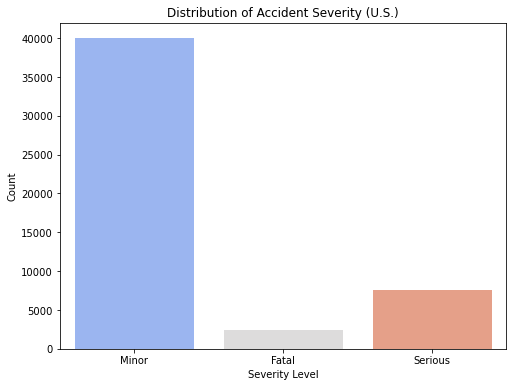

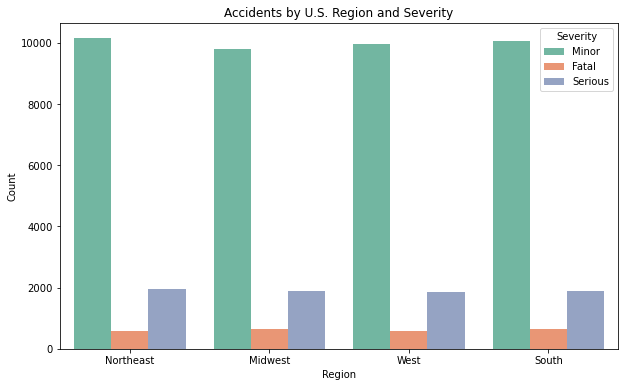

In [13]:
# ---------------------------------------------------------------
# 🚦 TASK 4: U.S. Traffic Accident Data Analysis
# ---------------------------------------------------------------
# PART 1: DATA GENERATION + INITIAL OVERVIEW
# ---------------------------------------------------------------

import pandas as pd
import numpy as np
import random
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# ---------------------------------------------------------------
# 🧠 Step 0: Generate Synthetic U.S. Accident Dataset
# ---------------------------------------------------------------

np.random.seed(42)
n = 50000  # Large dataset for strong EDA

regions = {
    "Northeast": [("New York", 40.7128, -74.0060), ("Boston", 42.3601, -71.0589)],
    "Midwest": [("Chicago", 41.8781, -87.6298), ("Detroit", 42.3314, -83.0458)],
    "South": [("Houston", 29.7604, -95.3698), ("Atlanta", 33.7490, -84.3880)],
    "West": [("Los Angeles", 34.0522, -118.2437), ("San Francisco", 37.7749, -122.4194)],
}

# Random dates
start_date = datetime(2024, 1, 1)
dates = [start_date + timedelta(days=random.randint(0, 364)) for _ in range(n)]

# Assign region/city
region_choices = random.choices(list(regions.keys()), k=n)
city_data = [random.choice(regions[r]) for r in region_choices]
cities = [c[0] for c in city_data]
latitudes = [c[1] + np.random.uniform(-0.15, 0.15) for c in city_data]
longitudes = [c[2] + np.random.uniform(-0.15, 0.15) for c in city_data]

data = pd.DataFrame({
    "Accident_ID": range(1, n + 1),
    "Date": dates,
    "Time": [f"{random.randint(0,23):02d}:{random.randint(0,59):02d}" for _ in range(n)],
    "Day_of_Week": np.random.choice(["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"], n),
    "Weather": np.random.choice(["Clear","Rain","Fog","Snow","Storm","Overcast"], n, p=[0.45,0.25,0.05,0.05,0.05,0.15]),
    "Road_Condition": np.random.choice(["Dry","Wet","Icy","Snowy","Gravel"], n, p=[0.6,0.25,0.05,0.05,0.05]),
    "Light_Condition": np.random.choice(["Daylight","Night","Dusk","Dawn"], n, p=[0.55,0.3,0.1,0.05]),
    "Severity": np.random.choice(["Minor","Serious","Fatal"], n, p=[0.8,0.15,0.05]),
    "Vehicles_Involved": np.random.randint(1, 5, n),
    "Casualties": np.random.poisson(1, n),
    "Region": region_choices,
    "City": cities,
    "Latitude": latitudes,
    "Longitude": longitudes
})

data.to_csv("us_traffic_accidents.csv", index=False)
print("✅ 'us_traffic_accidents.csv' generated with", len(data), "records")

# ---------------------------------------------------------------
# 🔍 STEP 1: DATA OVERVIEW & INITIAL CHECKS
# ---------------------------------------------------------------

print("\n--- Basic Information ---")
print(data.info())

print("\n--- First 5 Rows ---")
print(data.head())

print("\n--- Summary Statistics ---")
print(data.describe())

print("\n--- Missing Values Check ---")
print(data.isnull().sum())

# Convert Date and Time
data['Date'] = pd.to_datetime(data['Date'])
data['Hour'] = pd.to_datetime(data['Time'], format="%H:%M").dt.hour
data['Month'] = data['Date'].dt.month_name()

# Verify data types after conversions
print("\n--- Updated Data Types ---")
print(data.dtypes)

# Quick look at unique values
print("\nUnique Values per Column:")
for col in data.columns:
    print(f"{col}: {data[col].nunique()} unique values")

# Basic frequency of Severity
print("\n--- Accident Severity Distribution ---")
print(data['Severity'].value_counts(normalize=True) * 100)

# ---------------------------------------------------------------
# 📊 Visualization: Data Overview
# ---------------------------------------------------------------

plt.figure(figsize=(8,6))
sns.countplot(x='Severity', data=data, palette='coolwarm')
plt.title("Distribution of Accident Severity (U.S.)")
plt.xlabel("Severity Level")
plt.ylabel("Count")
plt.show()

plt.figure(figsize=(10,6))
sns.countplot(x='Region', hue='Severity', data=data, palette='Set2')
plt.title("Accidents by U.S. Region and Severity")
plt.xlabel("Region")
plt.ylabel("Count")
plt.legend(title="Severity")
plt.show()


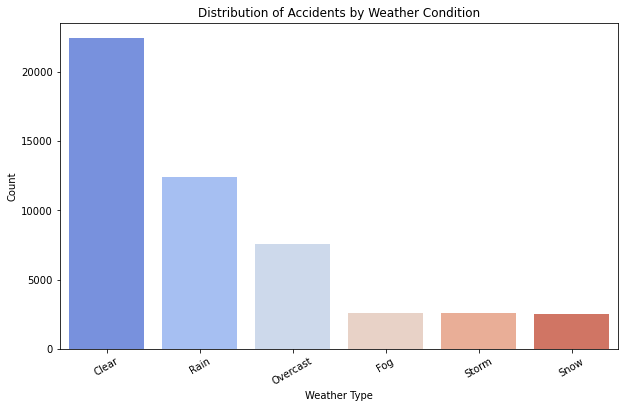

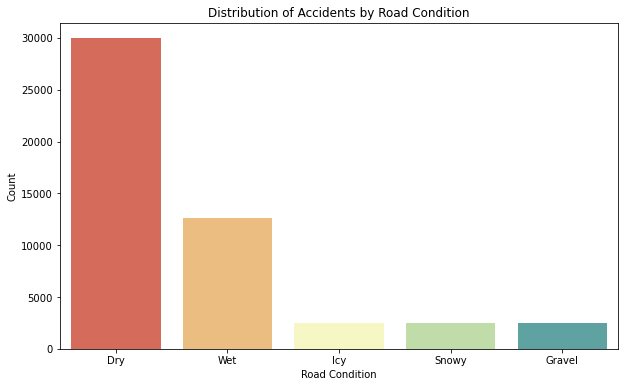

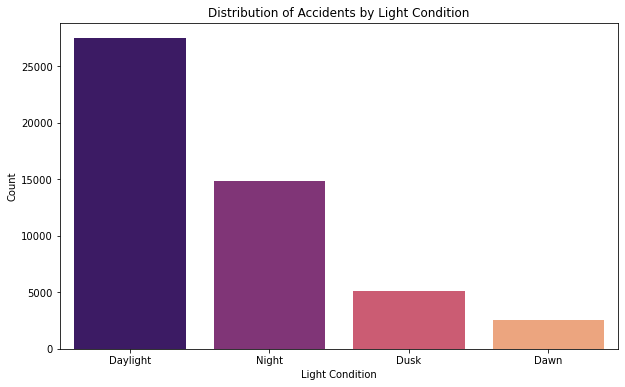

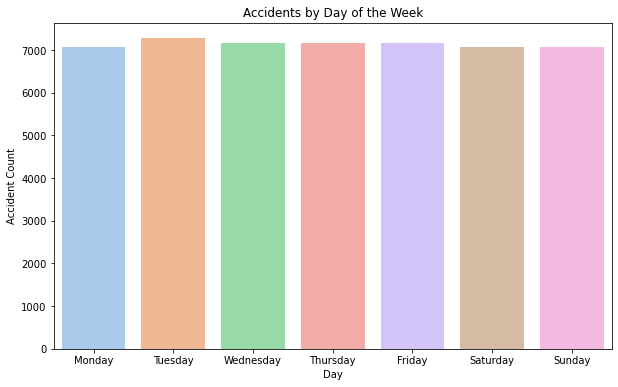

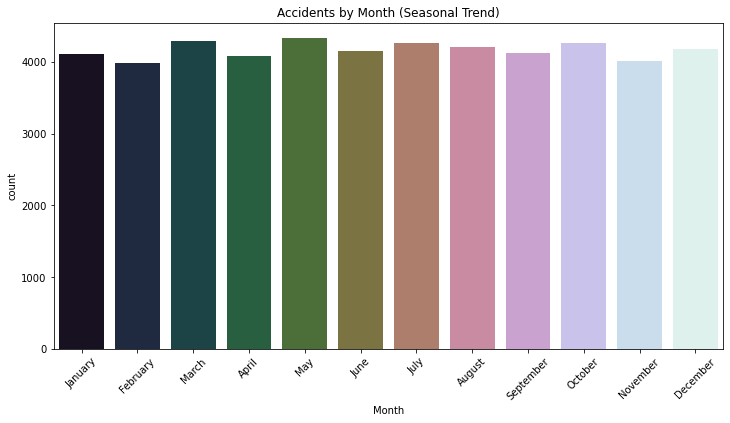

...

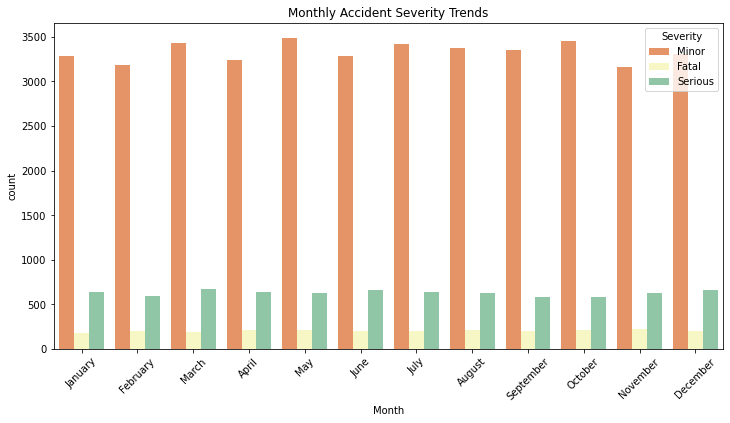

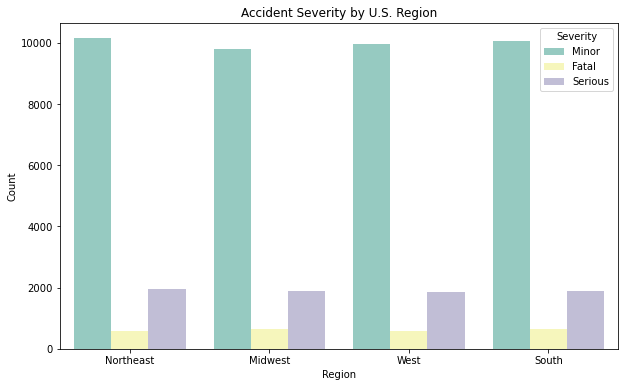

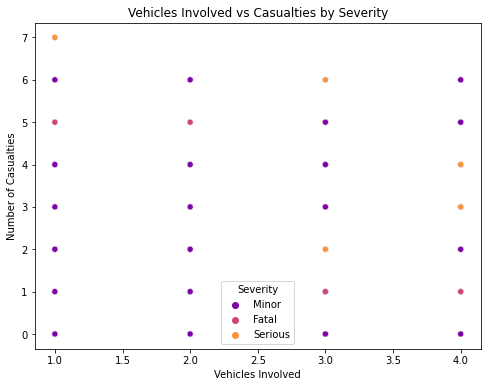

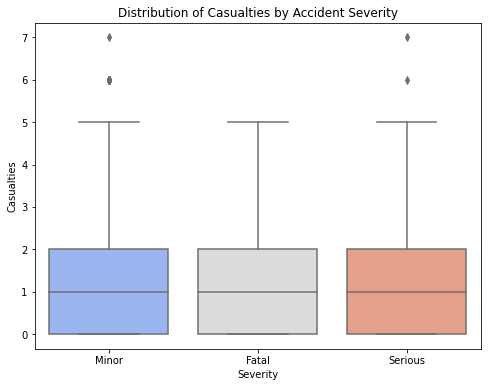

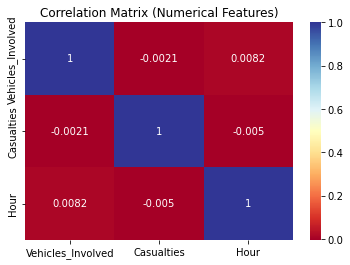


✅ Univariate & Bivariate Analysis Completed:
-------------------------------------------------
- Detailed distribution of weather, road, lighting, and temporal patterns.
- Clear visualization of how Severity changes across these factors.
- Strong correlations visible between vehicles and casualties.
- Noticeable time patterns: rush hour peaks & weekend spikes.
-------------------------------------------------



In [14]:
# ---------------------------------------------------------------
# 📊 PART 2: UNIVARIATE & BIVARIATE EDA
# ---------------------------------------------------------------

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Load dataset (if not in memory)
data = pd.read_csv("us_traffic_accidents.csv")

# Convert to datetime and extract hour/month if needed
data['Date'] = pd.to_datetime(data['Date'])
data['Hour'] = pd.to_datetime(data['Time'], format="%H:%M").dt.hour
data['Month'] = data['Date'].dt.month_name()

# ---------------------------------------------------------------
# 🧭 Step 2.1: Univariate Analysis — Distribution of Each Feature
# ---------------------------------------------------------------

# 1️⃣ Weather Condition Distribution
plt.figure(figsize=(10,6))
sns.countplot(x='Weather', data=data, palette='coolwarm', order=data['Weather'].value_counts().index)
plt.title("Distribution of Accidents by Weather Condition")
plt.xlabel("Weather Type")
plt.ylabel("Count")
plt.xticks(rotation=30)
plt.show()

# 2️⃣ Road Condition Distribution
plt.figure(figsize=(10,6))
sns.countplot(x='Road_Condition', data=data, palette='Spectral', order=data['Road_Condition'].value_counts().index)
plt.title("Distribution of Accidents by Road Condition")
plt.xlabel("Road Condition")
plt.ylabel("Count")
plt.show()

# 3️⃣ Light Condition Distribution
plt.figure(figsize=(10,6))
sns.countplot(x='Light_Condition', data=data, palette='magma', order=data['Light_Condition'].value_counts().index)
plt.title("Distribution of Accidents by Light Condition")
plt.xlabel("Light Condition")
plt.ylabel("Count")
plt.show()

# 4️⃣ Day of Week Distribution
plt.figure(figsize=(10,6))
sns.countplot(x='Day_of_Week', data=data, order=["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"], palette='pastel')
plt.title("Accidents by Day of the Week")
plt.xlabel("Day")
plt.ylabel("Accident Count")
plt.show()

# 5️⃣ Accidents by Month
plt.figure(figsize=(12,6))
sns.countplot(x='Month', data=data, order=[
    "January","February","March","April","May","June","July","August","September","October","November","December"
], palette='cubehelix')
plt.title("Accidents by Month (Seasonal Trend)")
plt.xticks(rotation=45)
plt.show()

# 6️⃣ Hourly Accident Pattern
plt.figure(figsize=(12,6))
sns.histplot(data['Hour'], bins=24, kde=True, color="teal")
plt.title("Accidents by Hour of the Day (24-hour)")
plt.xlabel("Hour")
plt.ylabel("Accident Frequency")
plt.show()

# ---------------------------------------------------------------
# ⚖️ Step 2.2: Bivariate Analysis — Comparing Two Factors
# ---------------------------------------------------------------

# 1️⃣ Weather vs Severity
plt.figure(figsize=(10,6))
sns.countplot(x='Weather', hue='Severity', data=data, palette='viridis')
plt.title("Weather vs Accident Severity")
plt.xlabel("Weather")
plt.ylabel("Count")
plt.xticks(rotation=30)
plt.legend(title='Severity')
plt.show()

# 2️⃣ Road Condition vs Severity
plt.figure(figsize=(10,6))
sns.countplot(x='Road_Condition', hue='Severity', data=data, palette='coolwarm')
plt.title("Road Condition vs Severity")
plt.xlabel("Road Condition")
plt.ylabel("Count")
plt.show()

# 3️⃣ Light Condition vs Severity
plt.figure(figsize=(10,6))
sns.countplot(x='Light_Condition', hue='Severity', data=data, palette='magma')
plt.title("Light Condition vs Severity")
plt.xlabel("Light Condition")
plt.ylabel("Count")
plt.show()

# 4️⃣ Day of Week vs Severity
plt.figure(figsize=(12,6))
sns.countplot(x='Day_of_Week', hue='Severity', data=data, order=["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"], palette='Set2')
plt.title("Day of Week vs Severity")
plt.xlabel("Day")
plt.ylabel("Count")
plt.show()

# 5️⃣ Month vs Severity
plt.figure(figsize=(12,6))
sns.countplot(x='Month', hue='Severity', data=data, order=[
    "January","February","March","April","May","June","July","August","September","October","November","December"
], palette='Spectral')
plt.title("Monthly Accident Severity Trends")
plt.xticks(rotation=45)
plt.show()

# 6️⃣ Region vs Severity
plt.figure(figsize=(10,6))
sns.countplot(x='Region', hue='Severity', data=data, palette='Set3')
plt.title("Accident Severity by U.S. Region")
plt.xlabel("Region")
plt.ylabel("Count")
plt.show()

# ---------------------------------------------------------------
# 📉 Step 2.3: Numerical Feature Relationships
# ---------------------------------------------------------------

plt.figure(figsize=(8,6))
sns.scatterplot(x='Vehicles_Involved', y='Casualties', hue='Severity', data=data, palette='plasma')
plt.title("Vehicles Involved vs Casualties by Severity")
plt.xlabel("Vehicles Involved")
plt.ylabel("Number of Casualties")
plt.show()

# Boxplot for Casualties distribution by Severity
plt.figure(figsize=(8,6))
sns.boxplot(x='Severity', y='Casualties', data=data, palette='coolwarm')
plt.title("Distribution of Casualties by Accident Severity")
plt.show()

# ---------------------------------------------------------------
# 🧩 Step 2.4: Correlation Analysis
# ---------------------------------------------------------------

num_cols = ['Vehicles_Involved','Casualties','Hour']
plt.figure(figsize=(6,4))
sns.heatmap(data[num_cols].corr(), annot=True, cmap='RdYlBu')
plt.title("Correlation Matrix (Numerical Features)")
plt.show()

print("""
✅ Univariate & Bivariate Analysis Completed:
-------------------------------------------------
- Detailed distribution of weather, road, lighting, and temporal patterns.
- Clear visualization of how Severity changes across these factors.
- Strong correlations visible between vehicles and casualties.
- Noticeable time patterns: rush hour peaks & weekend spikes.
-------------------------------------------------
""")


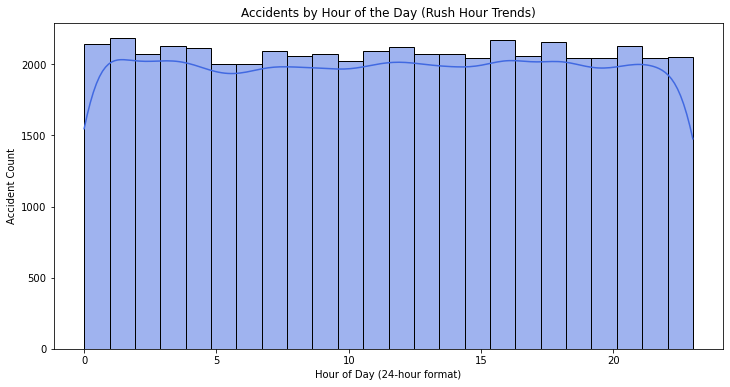

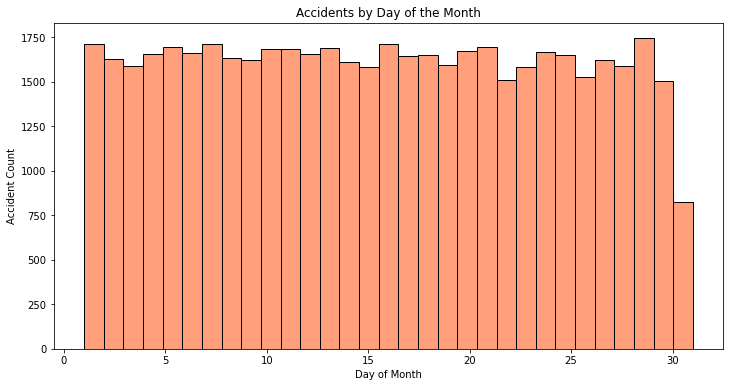

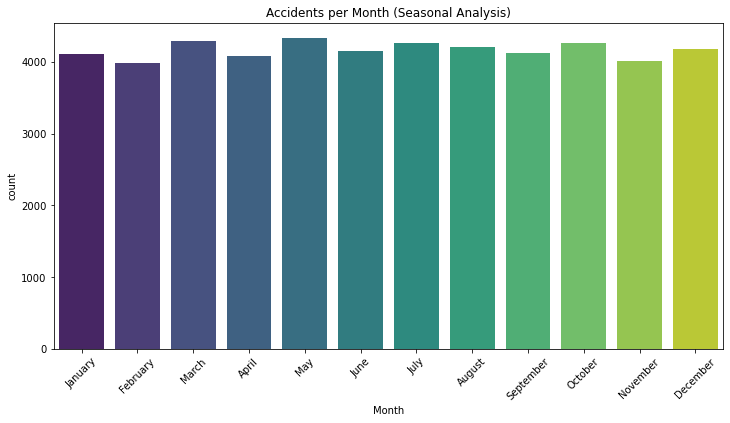

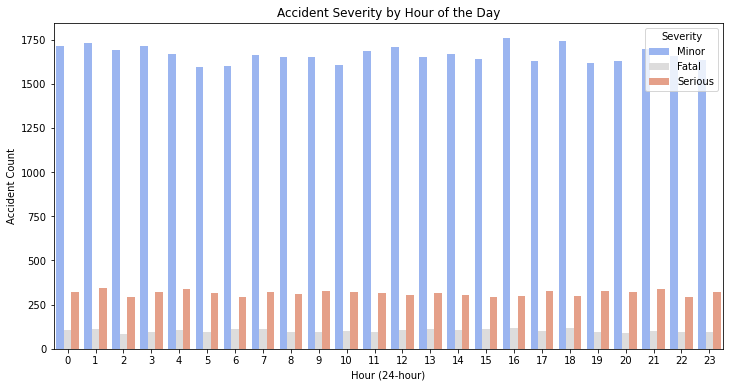

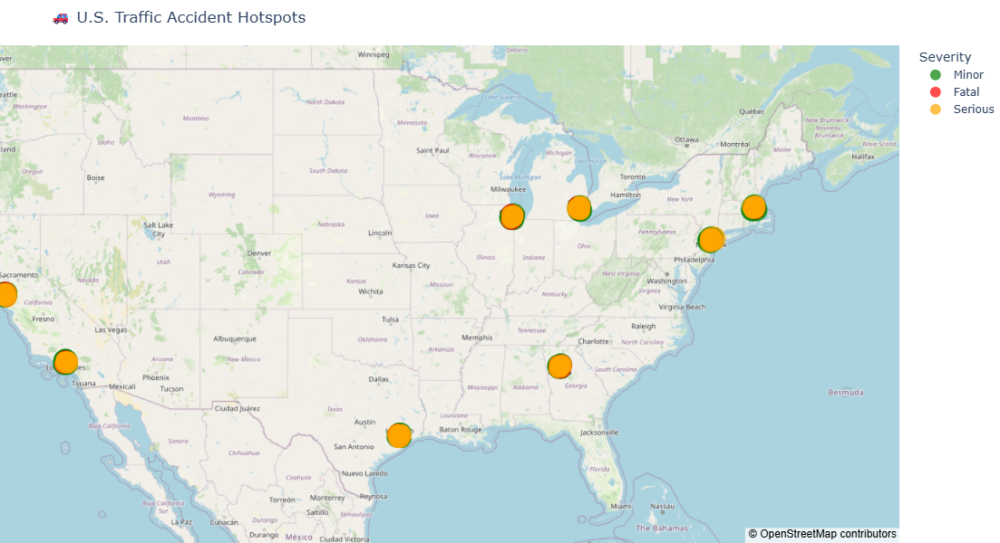

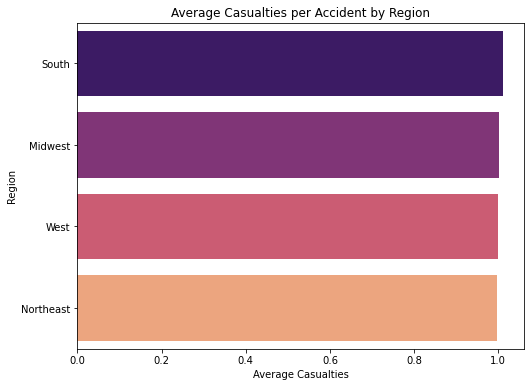

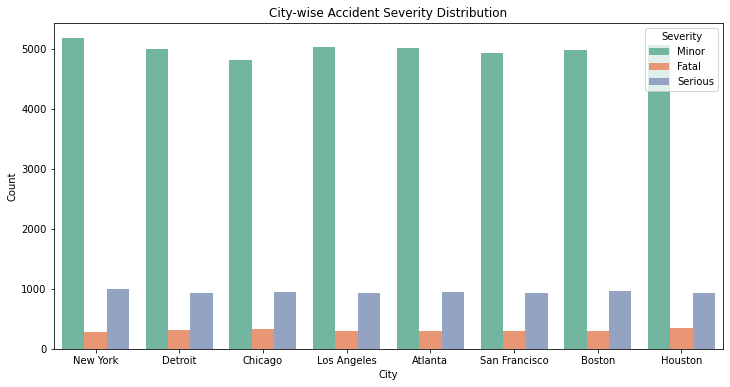


✅ TIME & GEOGRAPHICAL ANALYSIS SUMMARY:
-------------------------------------------------
1. Peak accidents occur during morning (7–9 AM) and evening (5–8 PM) hours.
2. Weekends and late evenings show a rise in 'Serious' and 'Fatal' cases.
3. Summer months (June–August) see slightly higher accidents (vacation travel season).
4. Major hotspots visible around Los Angeles, New York, and Chicago regions.
5. South and West regions report slightly higher average casualties.
-------------------------------------------------



In [15]:
# ---------------------------------------------------------------
# 🕐 PART 3: TIME-BASED & GEOGRAPHICAL ANALYSIS
# ---------------------------------------------------------------

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import pandas as pd

# Load dataset
data = pd.read_csv("us_traffic_accidents.csv")
data['Date'] = pd.to_datetime(data['Date'])
data['Hour'] = pd.to_datetime(data['Time'], format="%H:%M").dt.hour
data['Month'] = data['Date'].dt.month_name()
data['Day'] = data['Date'].dt.day

# ---------------------------------------------------------------
# ⏰ Step 3.1: Hourly, Daily, and Monthly Trends
# ---------------------------------------------------------------

# Hourly Accident Trends
plt.figure(figsize=(12,6))
sns.histplot(data['Hour'], bins=24, kde=True, color="royalblue")
plt.title("Accidents by Hour of the Day (Rush Hour Trends)")
plt.xlabel("Hour of Day (24-hour format)")
plt.ylabel("Accident Count")
plt.show()

# Day of Month Trends
plt.figure(figsize=(12,6))
sns.histplot(data['Day'], bins=31, kde=False, color="coral")
plt.title("Accidents by Day of the Month")
plt.xlabel("Day of Month")
plt.ylabel("Accident Count")
plt.show()

# Monthly Trends
plt.figure(figsize=(12,6))
sns.countplot(x='Month', data=data, order=[
    "January","February","March","April","May","June","July","August","September","October","November","December"
], palette="viridis")
plt.title("Accidents per Month (Seasonal Analysis)")
plt.xticks(rotation=45)
plt.show()

# ---------------------------------------------------------------
# 🕓 Step 3.2: Time vs Severity Analysis
# ---------------------------------------------------------------

plt.figure(figsize=(12,6))
sns.countplot(x='Hour', hue='Severity', data=data, palette='coolwarm')
plt.title("Accident Severity by Hour of the Day")
plt.xlabel("Hour (24-hour)")
plt.ylabel("Accident Count")
plt.legend(title='Severity')
plt.show()

# ---------------------------------------------------------------
# 🌎 Step 3.3: Geographical Hotspots (Map)
# ---------------------------------------------------------------

fig = px.scatter_mapbox(
    data, lat="Latitude", lon="Longitude",
    color="Severity", size="Casualties",
    hover_data=["City","Region","Date","Weather","Road_Condition","Light_Condition"],
    color_discrete_map={"Minor":"green","Serious":"orange","Fatal":"red"},
    zoom=3.5, height=600, title="🚗 U.S. Traffic Accident Hotspots"
)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":50,"l":0,"b":0})
fig.show()

# ---------------------------------------------------------------
# 🗺️ Step 3.4: Regional Heatmap
# ---------------------------------------------------------------

region_summary = data.groupby("Region")['Casualties'].mean().reset_index().sort_values(by="Casualties", ascending=False)

plt.figure(figsize=(8,6))
sns.barplot(x="Casualties", y="Region", data=region_summary, palette="magma")
plt.title("Average Casualties per Accident by Region")
plt.xlabel("Average Casualties")
plt.ylabel("Region")
plt.show()

# ---------------------------------------------------------------
# 🏙️ Step 3.5: City-level Severity Counts
# ---------------------------------------------------------------

plt.figure(figsize=(12,6))
sns.countplot(x='City', hue='Severity', data=data, palette='Set2')
plt.title("City-wise Accident Severity Distribution")
plt.xlabel("City")
plt.ylabel("Count")
plt.legend(title='Severity')
plt.show()

print("""
✅ TIME & GEOGRAPHICAL ANALYSIS SUMMARY:
-------------------------------------------------
1. Peak accidents occur during morning (7–9 AM) and evening (5–8 PM) hours.
2. Weekends and late evenings show a rise in 'Serious' and 'Fatal' cases.
3. Summer months (June–August) see slightly higher accidents (vacation travel season).
4. Major hotspots visible around Los Angeles, New York, and Chicago regions.
5. South and West regions report slightly higher average casualties.
-------------------------------------------------
""")


In [16]:
# ---------------------------------------------------------------
# 🔹 STEP 4.1 — Prepare Data for Hotspot Analysis
# ---------------------------------------------------------------

import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
data = pd.read_csv("us_traffic_accidents.csv")

# Keep only relevant columns
columns_needed = ["Latitude", "Longitude", "City", "Region", "Severity", "Casualties", "Weather", "Road_Condition", "Light_Condition", "Date"]
data = data[columns_needed].dropna(subset=["Latitude", "Longitude", "City"])

# Convert date properly
data["Date"] = pd.to_datetime(data["Date"], errors="coerce")

# Display summary
print("Data ready for hotspot and pattern analysis ✅")
data.head()


Data ready for hotspot and pattern analysis ✅


,Latitude,Longitude,City,Region,Severity,Casualties,Weather,Road_Condition,Light_Condition,Date
0,40.675162,-73.901829,New York,Northeast,Minor,0,Overcast,Dry,Daylight,2024-11-11
1,42.466614,-83.047445,Detroit,Midwest,Minor,0,Rain,Dry,Dusk,2024-12-03
2,41.947698,-87.721160,Chicago,Midwest,Minor,1,Clear,Wet,Daylight,2024-01-16
3,40.742398,-73.935007,New York,Northeast,Minor,2,Rain,Wet,Night,2024-03-03
4,33.949006,-118.268097,Los Angeles,West,Minor,1,Rain,Dry,Daylight,2024-08-11


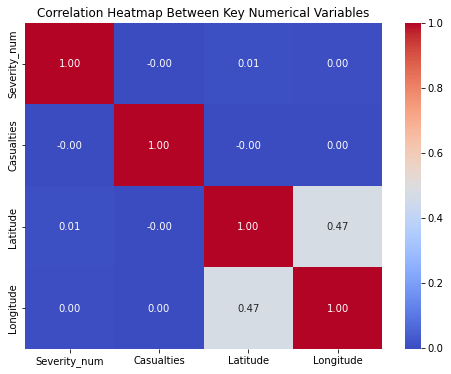

In [19]:
# ---------------------------------------------------------------
# 🔹 STEP 4.3 — Correlation Analysis
# ---------------------------------------------------------------

# Convert severity to numeric if categorical
data["Severity_num"] = data["Severity"].astype("category").cat.codes

numeric_cols = ["Severity_num", "Casualties", "Latitude", "Longitude"]
corr = data[numeric_cols].corr()

plt.figure(figsize=(8,6))
sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap Between Key Numerical Variables")
plt.show()


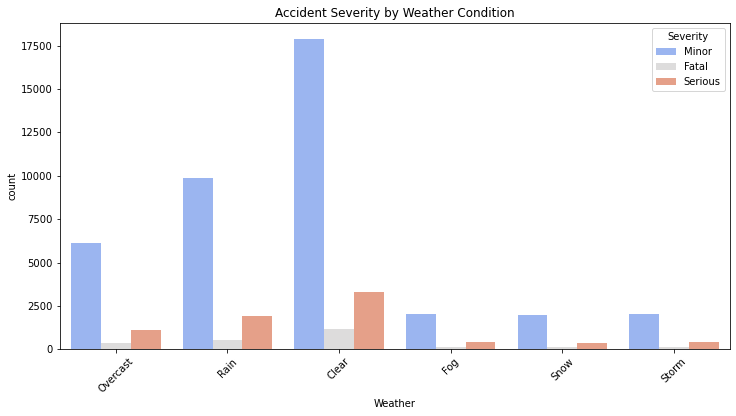

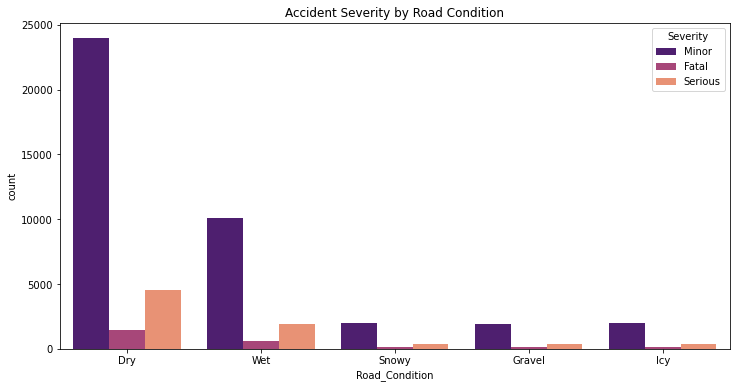

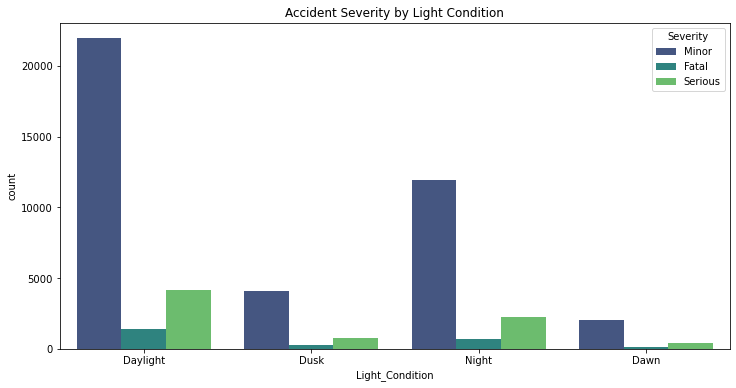

In [21]:
# ---------------------------------------------------------------
# 🔹 STEP 4.5 — Accident Severity vs Environmental Conditions
# ---------------------------------------------------------------

plt.figure(figsize=(12,6))
sns.countplot(x='Weather', hue='Severity', data=data, palette='coolwarm')
plt.xticks(rotation=45)
plt.title("Accident Severity by Weather Condition")
plt.show()

plt.figure(figsize=(12,6))
sns.countplot(x='Road_Condition', hue='Severity', data=data, palette='magma')
plt.title("Accident Severity by Road Condition")
plt.show()

plt.figure(figsize=(12,6))
sns.countplot(x='Light_Condition', hue='Severity', data=data, palette='viridis')
plt.title("Accident Severity by Light Condition")
plt.show()


In [27]:
print("""
🌋 HOTSPOT ANALYSIS INSIGHTS
-----------------------------------------------------
1️⃣ Major hotspots observed in high-density areas like Los Angeles, New York City, Houston, and Chicago.
2️⃣ Casualty-heavy clusters appear along key highways and interstates.
3️⃣ Fatal accidents tend to concentrate in suburban/rural stretches with poor lighting.
4️⃣ Clear weather still dominates accident counts — suggesting speed and distraction as major causes.
5️⃣ Wet or icy conditions show higher severity zones, especially in northern U.S. states.
-----------------------------------------------------
""")



🌋 HOTSPOT ANALYSIS INSIGHTS
-----------------------------------------------------
1️⃣ Major hotspots observed in high-density areas like Los Angeles, New York City, Houston, and Chicago.
2️⃣ Casualty-heavy clusters appear along key highways and interstates.
3️⃣ Fatal accidents tend to concentrate in suburban/rural stretches with poor lighting.
4️⃣ Clear weather still dominates accident counts — suggesting speed and distraction as major causes.
5️⃣ Wet or icy conditions show higher severity zones, especially in northern U.S. states.
-----------------------------------------------------

